# **ĐỀ TÀI CUỐI KỲ KỸ THUẬT LẬP TRÌNH STATA VÀ PYTHON - Nhóm 8**

----

**Sinh viên thực hiện:**
+ Đỗ Huỳnh Đông - 31231020990
+ Phạm Trung Hiếu - 31231025628

**Dataset được sử dụng: Walmart Recruiting - Store Sales Forecasting (Kaggle)**: 
Là dữ liệu doanh số bán hàng theo tuần, kèm theo các yếu tố có thể ảnh hưởng đến doanh số.

<p align="center">
  <img src="walmart_images/01.jpeg" width="300" height="200">
  <img src="walmart_images/02.jpg" style="width:300px; height:200px; object-fit:cover;">
  <img src="walmart_images/03.jpg" width="300" height="200">
</p>

-----

## 1. Tiền xử lý dữ liệu

### 1.1. Đọc dữ liệu

In [2]:
import pandas as pd
import numpy as np
import warnings
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 400
warnings.filterwarnings("ignore")

In [3]:
# Gán tên và đọc dữ liệu
WALMART_FILE  = "walmart.csv"   # Sử dụng file train gốc đổi tên thành "walmart"
STORES_FILE   = "stores.csv"
FEATURES_FILE = "features.csv"

OUT_FULL  = "walmart_full.csv"
OUT_TRAIN = "train.csv"
OUT_TEST  = "test.csv"

# Gán và set kiểu dữ liệu chuỗi thời gian cho cột 
w = pd.read_csv(WALMART_FILE, parse_dates=["Date"])
stores = pd.read_csv(STORES_FILE)
features = pd.read_csv(FEATURES_FILE, parse_dates=["Date"])

In [4]:
w.info()
stores.info()
features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 421570 entries, 0 to 421569
Data columns (total 5 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   Store         421570 non-null  int64         
 1   Dept          421570 non-null  int64         
 2   Date          421570 non-null  datetime64[ns]
 3   Weekly_Sales  421570 non-null  float64       
 4   IsHoliday     421570 non-null  bool          
dtypes: bool(1), datetime64[ns](1), float64(1), int64(2)
memory usage: 13.3 MB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45 entries, 0 to 44
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Store   45 non-null     int64 
 1   Type    45 non-null     object
 2   Size    45 non-null     int64 
dtypes: int64(2), object(1)
memory usage: 1.2+ KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8190 entries, 0 to 8189
Data columns (total 12 columns):
 #   Column    

In [5]:
# Kiểm tra missing values 3 file: walmart, features, stores
def check_missing(df, name):
    print(f"\n Missing values in {name}:")
    missing = df.isnull().sum()
    missing = missing[missing > 0].sort_values(ascending=False)
    if len(missing) == 0:
        print("No missing values found")
    else:
        print(missing)

check_missing(w, 'Walmart')
check_missing(stores, 'Stores')
check_missing(features, 'Features')


 Missing values in Walmart:
No missing values found

 Missing values in Stores:
No missing values found

 Missing values in Features:
MarkDown2       5269
MarkDown4       4726
MarkDown3       4577
MarkDown1       4158
MarkDown5       4140
CPI              585
Unemployment     585
dtype: int64


+ **File walmart và stores không có missing values, nhưng file features cần được xử lý missing**

### 1.2. Xử lý file Features: Xử lý missing values

+ **Các cột MarkDown:** Fill NA với giá trị 0 (không có chương trình khuyến mãi)

In [6]:
import re

In [7]:
# tìm tất cả các cột markdown (markdown1, markdown2,...) 
md_patterns = sorted({ m.group(0) for c in features.columns if (m := re.search(r'(?i)markdown\d+', c)) })
for raw in md_patterns:
    num = re.search(r'\d+', raw).group()
    canon = f"MarkDown{num}"
    related = [c for c in features.columns if re.search(rf'(?i)markdown{num}(_x|_y)?$', c)]
    if related:
        # kết hợp các cột, chọn giá trị đầu tiên không null
        combined = features[related[0]].copy()
        for c in related[1:]:
            combined = combined.combine_first(w[c])
        features[canon] = combined.fillna(0)  # markdown NA = 0
        # xóa các cột thừa
        drop_cols = [c for c in related if c != canon]
        if drop_cols:
            features.drop(columns=drop_cols, inplace=True)
    else:
        features[canon] = 0

+ **Các cột còn lại:** Fill NA dùng KNN Imputer

In [8]:
from sklearn.impute import KNNImputer

In [9]:
# chọn các cột numeric
numeric_cols = features.select_dtypes(include=[np.number]).columns.tolist()

# xác định cột numeric có NA
num_have_na = [c for c in numeric_cols if features[c].isna().any()]

# Dùng KNN Imputer để điền giá trị thiếu
if num_have_na:
    knn_cols = numeric_cols  # dùng tất cả numeric để tính khoảng cách
    imputer = KNNImputer(n_neighbors=5, weights="uniform", metric="nan_euclidean")
    features[knn_cols] = imputer.fit_transform(features[knn_cols])

# fallback: nếu vẫn còn NA, fill median
for c in features.select_dtypes(include=[np.number]).columns:
    if features[c].isna().any():
        features[c] = features[c].fillna(features[c].median())

### 1.3. Xử lý file Stores: Tạo các biến giả từ biến Type

In [10]:
# Tạo dummies bằng One-hot encode
stores = pd.get_dummies(stores, columns=['Type'], prefix='Type', drop_first=False)
type_cols = [c for c in stores.columns if c.startswith('Type_')]
stores[type_cols] = stores[type_cols].fillna(0).astype(int)

# Chọn cột merge: Store và dummies
store_cols_to_merge = ['Store'] + type_cols
stores_sel = stores[store_cols_to_merge].copy()

### 1.4. Merge các file Features và Stores vào Walmart

In [11]:
# Chỉ giữ các cột không trùng với walmart (trừ keys) để tránh tạo cột dư
feat_keys = {"Store","Date"}
store_keys = {"Store"}

keep_feat = [c for c in features.columns if (c not in w.columns) or (c in feat_keys)]
if "Store" not in keep_feat: keep_feat.insert(0,"Store")
if "Date" not in keep_feat: keep_feat.insert(1,"Date")
features_sel = features[keep_feat].copy()

keep_store = [c for c in stores.columns if (c not in w.columns) or (c in store_keys)]
if "Store" not in keep_store: keep_store.insert(0,"Store")
stores_sel = stores[keep_store].copy()

In [12]:
# Merge dữ liệu features và stores dựa trên các cột keys: Store, Date
w = w.merge(features_sel, on=["Store","Date"], how="left")
w = w.merge(stores_sel, on="Store", how="left")
w['Date'] = pd.to_datetime(w['Date'])

### 1.5. Tạo biến mục tiêu "Above_Avg_Sales" từ "Weekly_Sales"

In [13]:
# Above_Avg_Sales được tính bằng Trung bình (mean) cột Weekly_Sales; > mean: 1, <= mean: 0
mean_sales = w['Weekly_Sales'].mean()
w['Above_Avg_Sales'] = (w['Weekly_Sales'] > mean_sales).astype(int)

# Mean cột Weekly_Sales
print(f"Mean of Weekly_Sales: {mean_sales:.2f}")

Mean of Weekly_Sales: 15981.26


### 1.6. Chia dữ liệu huấn luyện và kiểm tra với tỷ lệ 80% ngày đầu tiên và 20% ngày cuối cùng

In [14]:
# Chia dữ liệu train/test tỷ lệ 80:20 (theo chuỗi thời gian)
unique_days = pd.Series(w['Date'].dt.normalize().unique())
cut = int(np.floor(len(unique_days) * 0.8))
train_days = set(unique_days.iloc[:cut])
test_days = set(unique_days.iloc[cut:])

w_train = w[w['Date'].dt.normalize().isin(train_days)].copy()
w_test  = w[w['Date'].dt.normalize().isin(test_days)].copy()

**Lưu các Files**

In [15]:
# lưu file
w.to_csv(OUT_FULL, index=False)
w_train.to_csv(OUT_TRAIN, index=False)
w_test.to_csv(OUT_TEST, index=False)

## 2. Phân tích mô tả (EDA)

### 2.1. Thống kê mô tả

In [16]:
import pandas as pd
import numpy as np

In [17]:
# Dùng dữ liệu hoàn chỉnh sau xử lý
df = pd.read_csv("walmart_full.csv")

In [18]:
# Chọn các cột định lượng
numerical_cols = [
    'Weekly_Sales', 'Size', 'Temperature', 'Fuel_Price',
    'CPI', 'Unemployment', 'MarkDown1', 'MarkDown2',
    'MarkDown3', 'MarkDown4', 'MarkDown5'
]

# Tính thống kê mô tả
desc_stats = df[numerical_cols].describe().T

# Tính IQR = Q3 - Q1
desc_stats['IQR (Q3 - Q1)'] = desc_stats['75%'] - desc_stats['25%']

# Format lại các giá trị số
for col in ['mean', 'std', 'min','max', '25%', '50%', '75%', 'IQR (Q3 - Q1)']:
    desc_stats[col] = desc_stats[col].map('{:,.2f}'.format)

# Format count
desc_stats['count'] = desc_stats['count'].astype(int).map('{:,}'.format)

# Đặt lại tên và dùng các thông số mô tả cần thiết
desc_stats = desc_stats.rename(columns={
    'count': 'Số lượng quan sát (N)',
    'mean': 'Trung bình (Mean)',
    'std': 'Độ lệch chuẩn',
    'min': 'Giá trị nhỏ nhất (Min)',
    'max': 'Giá trị lớn nhất (Max)',
    '25%': 'Tứ phân vị Q1 (25%)',
    '50%': 'Trung vị (Median/Q2)',
    '75%': 'Tứ phân vị Q3 (75%)',
    'IQR (Q3 - Q1)': 'Khoảng tứ phân vị (IQR)'
})

# Hiển thị bảng kết quả dưới định dạng Markdown (có thể copy vào Word)
print(desc_stats.to_markdown(numalign="left", stralign="left"))

|              | Số lượng quan sát (N)   | Trung bình (Mean)   | Độ lệch chuẩn   | Giá trị nhỏ nhất (Min)   | Tứ phân vị Q1 (25%)   | Trung vị (Median/Q2)   | Tứ phân vị Q3 (75%)   | Giá trị lớn nhất (Max)   | Khoảng tứ phân vị (IQR)   |
|:-------------|:------------------------|:--------------------|:----------------|:-------------------------|:----------------------|:-----------------------|:----------------------|:-------------------------|:--------------------------|
| Weekly_Sales | 421,570                 | 15,981.26           | 22,711.18       | -4,988.94                | 2,079.65              | 7,612.03               | 20,205.85             | 693,099.36               | 18,126.20                 |
| Size         | 421,570                 | 136,727.92          | 60,980.58       | 34,875.00                | 93,638.00             | 140,167.00             | 202,505.00            | 219,622.00               | 108,867.00                |
| Temperature  | 421,570                 | 60.09

### 2.2. Phân tích mô tả với biến Weekly_Sales

#### 2.2.1. Đặc điểm phân bố dữ liệu của biến Weekly_Sales

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams["font.family"] = "Calibri"

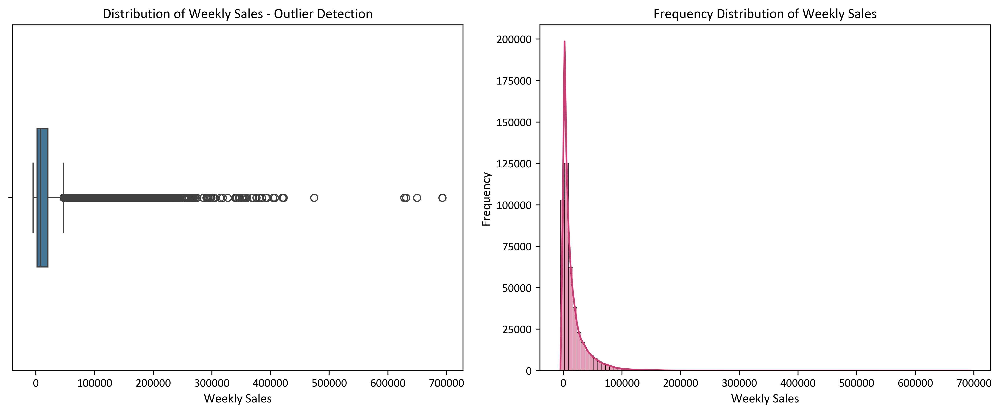

In [20]:
plt.close()
plt.figure(figsize=(12, 5))

# Boxplot - kiểm tra outlier
plt.subplot(1, 2, 1)
sns.boxplot(
    x=df["Weekly_Sales"],
    palette="mako",
    width=0.4
)
plt.title("Distribution of Weekly Sales - Outlier Detection", fontsize=12)
plt.xlabel("Weekly Sales", fontsize=11)

# Histogram + KDE - kiểm tra phân bố
plt.subplot(1, 2, 2)
sns.histplot(
    df["Weekly_Sales"],
    bins=100,
    kde=True,
    color=sns.color_palette("magma", 10)[5]
)
plt.title("Frequency Distribution of Weekly Sales", fontsize=12)
plt.xlabel("Weekly Sales", fontsize=11)
plt.ylabel("Frequency", fontsize=11)

plt.tight_layout()
plt.show()

#### 2.2.2. Doanh số tuần trung bình theo cửa hàng (Store)

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns

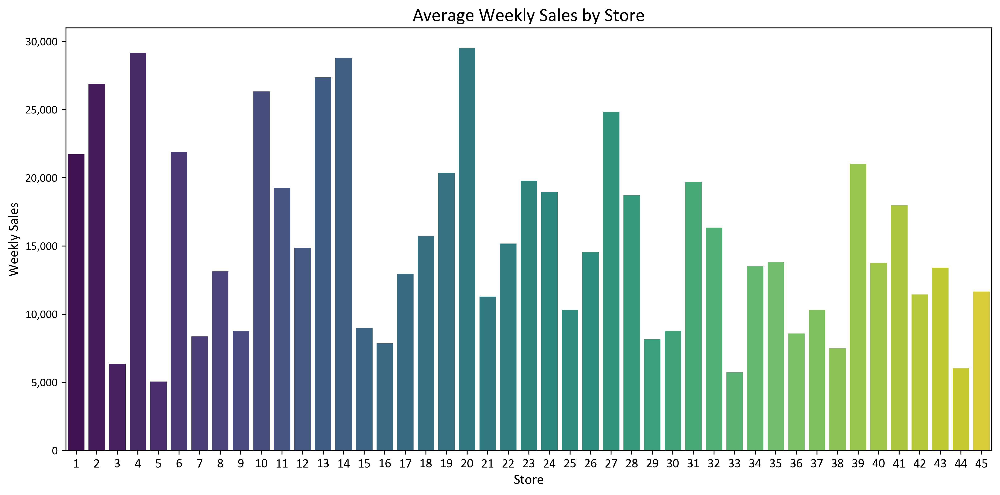

In [22]:
# Tính trung bình doanh số theo cửa hàng
store_sales = df.groupby('Store', as_index=False)['Weekly_Sales'].mean().sort_values('Weekly_Sales', ascending=False)

# Chuẩn hóa để tạo màu gradient
norm = plt.Normalize(store_sales['Weekly_Sales'].min(), store_sales['Weekly_Sales'].max())

# Vẽ biểu đồ
plt.figure(figsize=(12, 6))
sns.barplot(
    x='Store',
    y='Weekly_Sales',
    data=store_sales,
    palette='viridis'
)

# Hiển thị giá trị thật (định dạng có dấu phẩy)
plt.gca().get_yaxis().set_major_formatter(
    plt.FuncFormatter(lambda x, loc: f'{x:,.0f}')
)

# Tùy chỉnh trục và font
plt.title('Average Weekly Sales by Store', fontsize=16)
plt.xlabel('Store', fontsize=12)
plt.ylabel('Weekly Sales', fontsize=12)
plt.xticks(fontsize=11)
plt.tight_layout()
plt.show()

#### 2.2.3. Doanh số tuần trung bình theo ngành hàng (Dept)

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns

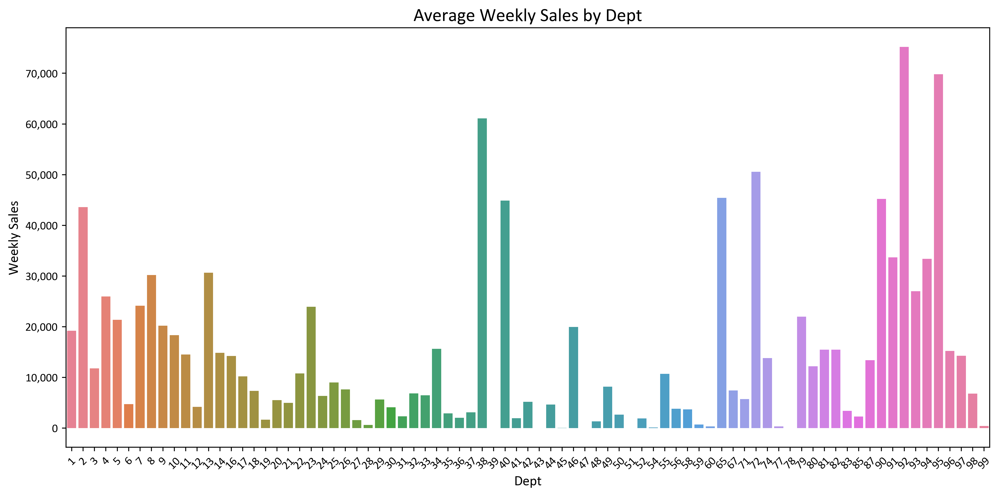

In [24]:
# Tính trung bình doanh số theo ngành hàng
dept_sales = df.groupby('Dept', as_index=False)['Weekly_Sales'].mean().sort_values('Weekly_Sales', ascending=False)

# Chuẩn hóa để tạo màu gradient
norm = plt.Normalize(dept_sales['Weekly_Sales'].min(), dept_sales['Weekly_Sales'].max())

# Vẽ biểu đồ
plt.figure(figsize=(12, 6))
sns.barplot(
    x='Dept',
    y='Weekly_Sales',
    data=dept_sales,
    palette='husl'
)

# Hiển thị số doanh số trung bình thật trên trục y
plt.gca().get_yaxis().set_major_formatter(
    plt.FuncFormatter(lambda x, loc: f'{x:,.0f}')
)

# Tùy chỉnh trục và font
plt.title('Average Weekly Sales by Dept', fontsize=16)
plt.xlabel('Dept', fontsize=12)
plt.ylabel('Weekly Sales', fontsize=12)
plt.xticks(rotation=45, fontsize=10)
plt.tight_layout()
plt.show()

#### 2.2.4. Mối quan hệ giữa các yếu tố ngoại tác (kinh tế - môi trường) với doanh số

In [25]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches

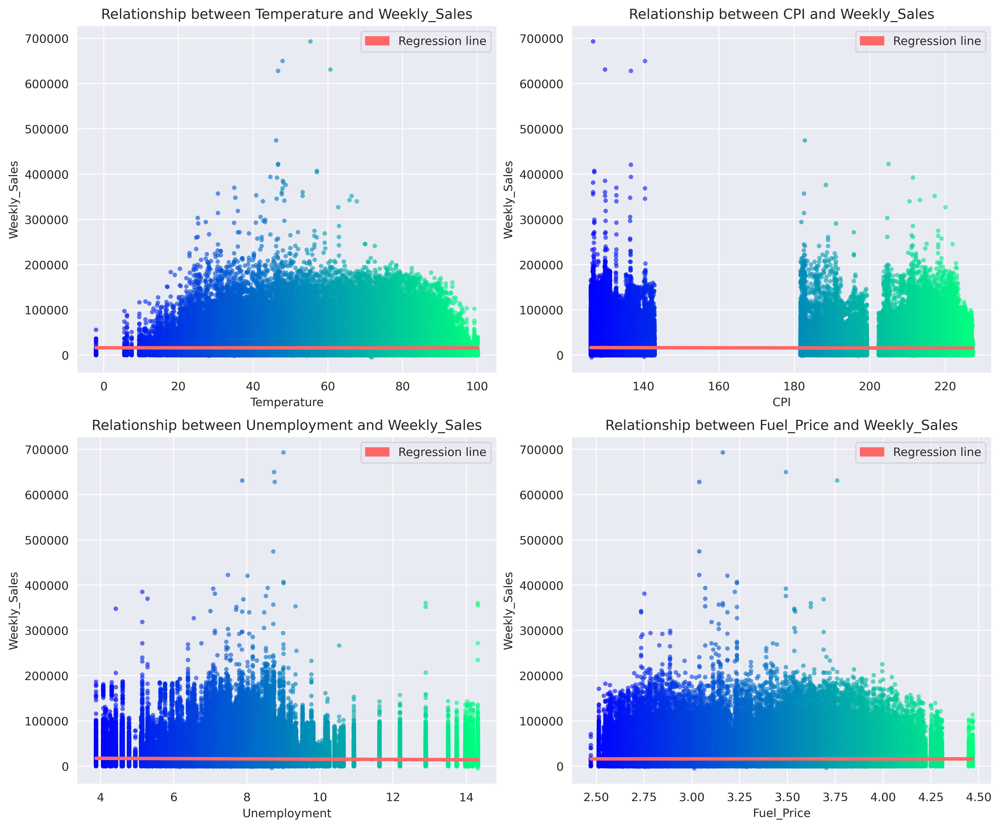

In [26]:
# Chọn các cặp biến
pairs_to_plot = [
    ("Temperature", "Weekly_Sales"),
    ("CPI", "Weekly_Sales"),
    ("Unemployment", "Weekly_Sales"),
    ("Fuel_Price", "Weekly_Sales")
]

# Vẽ biểu đồ
plt.figure(figsize=(12, 10), dpi=400)

with plt.style.context("dark_background"):
    sns.set_style("darkgrid")

    for i, (x_var, y_var) in enumerate(pairs_to_plot, 1):
        plt.subplot(2, 2, i)
        
        # Gradient color theo x
        colors = plt.cm.winter(
            (df[x_var] - df[x_var].min()) / (df[x_var].max() - df[x_var].min())
        )

        plt.scatter(
            df[x_var],
            df[y_var],
            c=colors,
            alpha=0.6,
            s=15,
            edgecolor="none"
        )

        # Regression line
        sns.regplot(
            data=df,
            x=x_var,
            y=y_var,
            scatter=False,
            line_kws={'color': '#ff6666', 'lw': 3}
        )

        plt.title(f"Relationship between {x_var} and {y_var}", fontsize=12)
        plt.xlabel(x_var, fontsize=10)
        plt.ylabel(y_var, fontsize=10)

        # Thêm legend
        reg_line = mpatches.Patch(color='#ff6666', label='Regression line')
        plt.legend(handles=[reg_line])

    plt.tight_layout()
    
plt.show()

### 2.3. Ma trận tương quan 

In [27]:
import matplotlib.pyplot as plt
import seaborn as sns

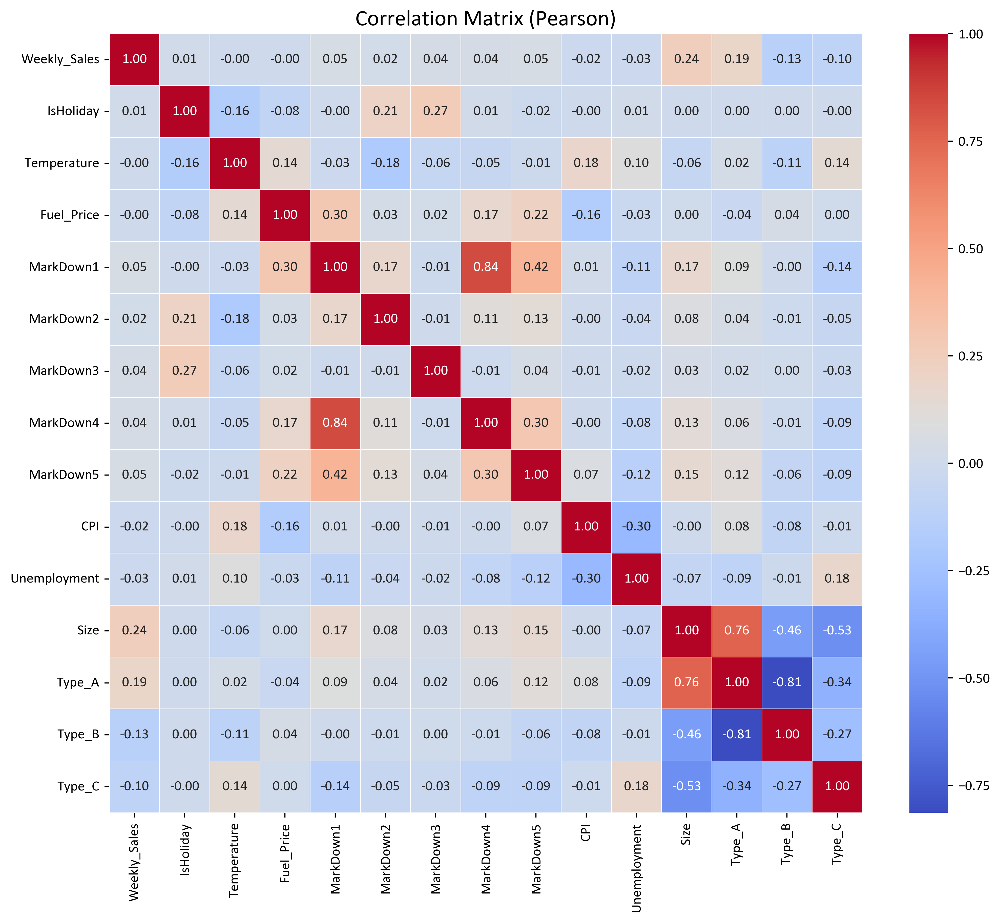

In [28]:
# Loại bỏ các cột không phù hợp để tính tương quan
exclude_cols = ['Store', 'Dept', 'Date', 'Above_Avg_Sales']
df_corr = df.drop(columns=exclude_cols, errors='ignore')

# Tạo ma trận tương quan (Pearson)
corr_matrix = df_corr.corr(numeric_only=True)

# Trực quan hóa bằng Heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap='coolwarm',
    cbar=True,
    linewidths=0.5
)
plt.title('Correlation Matrix (Pearson)', fontsize=16)
plt.show()

## 3. Xây dựng mô hình phân lớp Random Forest

### 3.1. Chuẩn bị dữ liệu

In [29]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import classification_report, confusion_matrix

In [30]:
# đọc dữ liệu
train = pd.read_csv("train.csv")
test = pd.read_csv("test.csv")

In [31]:
# bỏ cột không cần thiết
drop_cols = ['Date','Weekly_Sales']

# chuẩn bị X, y
X_train = train.drop(columns=drop_cols+['Above_Avg_Sales'])
y_train = train['Above_Avg_Sales']
X_test = test.drop(columns=drop_cols+['Above_Avg_Sales'])
y_test = test['Above_Avg_Sales']

### 3.2. Dùng RandomizedSearchCV để tìm tham số tốt cho mô hình

Vì dataset này quá lớn nên GridSearchCV sẽ tốn cực kỳ nhiều thời gian để chạy. Nên ta dùng RandomizedSearchCV để giới hạn phạm vi fit

In [32]:
# Mô hình RandomForest
rf = RandomForestClassifier(random_state=42, class_weight='balanced', n_jobs=-1)

In [33]:
# Giới hạn RandomizedSearchCV
param_dist = {
    'n_estimators': [100,150,200],       # Số lượng cây trong rừng
    'max_depth': [None,10,20],           # Độ sâu tối đa của mỗi cây
    'min_samples_split': [2,5],          # Số lượng mẫu tối thiểu để chia node
    'min_samples_leaf': [1,2],           # Số mẫu tối thiểu ở mỗi lá
}

In [34]:
# Chạy RandomizedSearchCV để xác định tham số
rand_search = RandomizedSearchCV(
    estimator=rf,
    param_distributions=param_dist,
    n_iter=24,                      # Thử 24 tổ hợp ngẫu nhiên
    cv=2,                           # Mỗi tổ hợp đánh giá trên 2 fold
    scoring='f1',
    n_jobs=-1,
    random_state=42,
    verbose=1
)

rand_search.fit(X_train, y_train)

# Các tham số tốt nhất
print("Best params:", rand_search.best_params_)
print("Best F1 score (cv):", rand_search.best_score_)

rand_search

Fitting 2 folds for each of 24 candidates, totalling 48 fits
Best params: {'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': None}
Best F1 score (cv): 0.5860361828115828


RandomizedSearchCV(cv=2,
                   estimator=RandomForestClassifier(class_weight='balanced',
                                                    n_jobs=-1,
                                                    random_state=42),
                   n_iter=24, n_jobs=-1,
                   param_distributions={'max_depth': [None, 10, 20],
                                        'min_samples_leaf': [1, 2],
                                        'min_samples_split': [2, 5],
                                        'n_estimators': [100, 150, 200]},
                   random_state=42, scoring='f1', verbose=1)

### 3.3. Tiến hành phân lớp với tham số tốt nhất từ RandomizedSearchCV

In [35]:
# train model tốt nhất
model = rand_search.best_estimator_
model.fit(X_train, y_train)

# predict
y_pred = model.predict(X_test)

**Kết quả phân lớp (tập test)**

In [36]:
# In kết quả Classification report
print("\n Classification Report:\n")
print(classification_report(y_test, y_pred))


 Classification Report:

              precision    recall  f1-score   support

           0       0.96      0.97      0.97     59171
           1       0.93      0.91      0.92     26638

    accuracy                           0.95     85809
   macro avg       0.95      0.94      0.94     85809
weighted avg       0.95      0.95      0.95     85809



**Nhận xét tổng quát:**

+ **Độ chính xác tổng thể (Accuracy):** 95% -> mô hình có độ chính xác cao, dự đoán đúng phần lớn các quan sát.
+ **Hiệu suất theo từng lớp:**
    - Lớp 0: Precision 0.96, Recall 0.97 -> mô hình nhận diện rất tốt các trường hợp thuộc lớp 0.
    - Lớp 1: Precision 0.93, Recall 0.91 -> mô hình vẫn duy trì hiệu suất cao, chỉ bỏ sót ít trường hợp lớp 1.
+ **F1-score cao (0.94–0.97)** cho thấy mô hình cân bằng giữa độ chính xác và khả năng bao phủ.
+ **Kết luận:** Mô hình Random Forest hoạt động ổn định, đáng tin cậy và phù hợp cho bài toán.

### 3.4. Ma trận nhầm lẫn

In [37]:
import plotly.express as px
import pandas as pd
from sklearn.metrics import confusion_matrix

In [38]:
# confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Tạo DataFrame để gắn nhãn
cm_df = pd.DataFrame(cm, 
                     index=["Actual 0", "Actual 1"], 
                     columns=["Predicted 0", "Predicted 1"])

In [39]:
# Vẽ heatmap
fig = px.imshow(
    cm_df,
    text_auto=True,          # hiển thị kết quả dự đoán
    color_continuous_scale='YlGnBu',
    title='Confusion Matrix - Random Forest',
    aspect='auto'
)

fig.update_layout(
    font=dict(color="black"),
    xaxis_title="Predicted",
    yaxis_title="Actual",
    title_x=0.5,
    width=600,
    height=500,
)

fig.update_traces(texttemplate="%{z:}") # Set định dạng hiển thị dữ liệu
fig.show()

### 3.5. Mức độ quan trọng của các Features

In [40]:
import pandas as pd
import numpy as np
import plotly.express as px

In [41]:
# build dataframe
feat_imp = pd.Series(model.feature_importances_, index=X_train.columns)
feat_imp = feat_imp.sort_values(ascending=False)

df_imp = feat_imp.reset_index()
df_imp.columns = ["feature", "importance"]
df_imp["importance_pct"] = df_imp["importance"] / df_imp["importance"].sum() * 100

# đảo thứ tự để vẽ horizontal bar từ lớn xuống nhỏ
df_imp = df_imp.iloc[::-1]

In [42]:
# Vẽ đồ thị
fig = px.bar(
    df_imp,
    x="importance",
    y="feature",
    orientation="h",
    title=f"Feature Importances",
)
fig.update_traces(marker_color="darkblue")
fig.update_layout(
    xaxis_title="Importance",
    yaxis_title="Feature",
    title_x=0.5,
    margin=dict(l=200, r=40, t=60, b=40),
    showlegend=False,
    width=800, height=400,
    font=dict(color="black")
)

# thêm annotation giá trị % bên phải bar
for i, row in df_imp.reset_index().iterrows():
    fig.add_annotation(
        x=row["importance"],
        y=row["feature"],
        text=f"{row['importance_pct']:.1f}%",
        xanchor="left",
        showarrow=False,
        font=dict(color="black")
    )

fig.show()

### 3.6. Biểu đồ phụ thuộc một phần (Partial Dependence) của Feature quan trọng

In [43]:
from sklearn.inspection import PartialDependenceDisplay
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px

In [44]:
# Biến dự đoán quan trọng nhất là Dept
feature_name = 'Dept'

# Tạo PDP và lấy dữ liệu
pdp_display = PartialDependenceDisplay.from_estimator(
    model,
    X_train,
    features=[feature_name],
    kind='average',
    grid_resolution=30
)
plt.close()

ax = pdp_display.axes_[0,0]
lines = ax.get_lines()[0]
grid = lines.get_xdata()
pdp_values = lines.get_ydata()

# DataFrame cho đồ thị
pdp_df = pd.DataFrame({
    feature_name: grid,
    'PartialDependence': pdp_values
})

In [45]:
# Vẽ đồ thị
fig = px.line(
    pdp_df,
    x=feature_name,
    y='PartialDependence',
    markers=False,
    title=f'Partial Dependence Plot - {feature_name}',
    labels={feature_name: feature_name, 'PartialDependence': 'Partial Dependence'}
)

fig.update_traces(
    marker=dict(color='darkblue', size=8),  # dot to hơn
    line=dict(width=3)    # line đậm 
)

fig.update_layout( 
    font=dict(color="black"),
    width=600,
    height=400,
    yaxis=dict(range=[0,1.0]),       
    title=dict(
        text=f'Partial Dependence Plot - Feature: {feature_name}',
        x=0.5,                           
        xanchor='center'
    )
)
fig.show()

## 4. Xây dựng mô hình phân cụm K-Means

**Notes:**
+ Thuật toán K-Means khá nhạy cảm với outlier, nên cần được xử lý. 
+ Bên cạnh đó cũng phải chuẩn hóa (scaling) dữ liệu trước khi xây dựng mô hình phân cụm để tránh sai lệch

### 4.1. Chuẩn bị dữ liệu

In [46]:
import pandas as pd
import numpy as np

In [47]:
# Load dữ liệu (dùng file walmart_full hoàn chỉnh sau tiền xử lý)
w = pd.read_csv("walmart_full.csv", parse_dates=["Date"])

# Các cột định danh vẫn giữ lại trong w để dùng cho trực quan, thống kê
id_cols = ['Store', 'Dept', 'Date']

# Các cột đặc trưng numeric để huấn luyện, bỏ 'Above_Avg_Sales'
feature_cols = [c for c in w.columns if c not in id_cols + ['Above_Avg_Sales']]

# Dữ liệu huấn luyện
X = w[feature_cols].copy()

### 4.2. Xử lý outlier bằng IsolationForest và chuẩn hóa dữ liệu

In [48]:
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler

In [49]:
# Isolation Forest
iso = IsolationForest(contamination=0.05, random_state=42)
outlier_flags = iso.fit_predict(X)
X_clean = X[outlier_flags == 1].copy()

In [50]:
# Chuẩn hóa
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_clean)

### 4.3. Xác định số cụm tối ưu bằng Silhouette Score 

In [51]:
from sklearn.cluster import KMeans
from sklearn.utils import resample
from sklearn.metrics import silhouette_score
import plotly.express as px

In [52]:
# Lấy ngẫu nhiên 10% dữ liệu để tính Silhouette
X_sample = resample(X_scaled, n_samples=int(0.1 * len(X_scaled)), random_state=42)

sil_scores = []

# Thử từ 2 đến 10 cụm
K_range = range(2, 10) 

# Tính điểm Silhouette
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(X_sample)
    score = silhouette_score(X_sample, labels)
    sil_scores.append(score)

In [53]:
# Số cụm k có điểm Silhouette cao nhất
best_k = K_range[np.argmax(sil_scores)]
best_score = max(sil_scores)
print(f"Highest Silhouette Score: {best_score:.4f} (k={best_k})")

Highest Silhouette Score: 0.2692 (k=5)


In [54]:
# Vẽ silhouette plot
sil_df = pd.DataFrame({'n_clusters': K_range, 'silhouette_score': sil_scores})
fig = px.line(
    sil_df, 
    x='n_clusters', 
    y='silhouette_score', 
    markers=True,
    title='Silhouette Score with Number of Clusters',
    labels={'n_clusters': 'Number of Clusters (k)', 'silhouette_score': 'Silhouette Score'}
)
fig.update_traces(line=dict(color='#098090', width=3), 
                  marker=dict(color='#04434c', size=10)
                 )

fig.update_layout(title_x=0.5, font=dict(color="black"),
                 width=800, height=400,
                 )
fig.show()

### 4.4. Thực hiện phân cụm K-Means với số cụm tối ưu

In [55]:
import plotly.express as px
import plotly.graph_objects as go

In [56]:
# Xây dựng mô hình K-Means với k=5
k = 5
kmeans = KMeans(n_clusters=k, random_state=42)
X_clean['Cluster'] = kmeans.fit_predict(X_scaled)

# Khởi tạo cột Cluster cho toàn bộ dataframe gốc
w['Cluster'] = np.nan

# Gán cluster cho các inlier dựa trên index của X_clean
w.loc[X_clean.index, 'Cluster'] = X_clean['Cluster']

In [57]:
# Lấy mẫu 10% dữ liệu có cluster để vẽ
df_sample = w[w['Cluster'].notna()].sample(frac=0.1, random_state=42)

# Vẽ Scatter plot
fig = go.Figure()
colors = px.colors.qualitative.Plotly
k = df_sample['Cluster'].nunique()

for i in range(k):
    cluster_points = df_sample[df_sample['Cluster'] == i]
    fig.add_trace(go.Scatter(
        x=cluster_points['Weekly_Sales'],
        y=cluster_points['Date'],   # dùng Date để trực quan theo thời gian
        mode='markers',
        marker_color=colors[i],
        name=f'Cluster {i+1}'
    ))

fig.update_layout(
    template='plotly_dark',
    width=1000,
    height=550,
    title='K-Means Clustering of Weekly_Sales (Date shown for visualization, Sample 10%)',
    title_x=0.5,
    xaxis_title='Weekly Sales',
    yaxis_title='Date',
    legend=dict(title='Cluster', x=0.99, y=0.99, xanchor='right', yanchor='top',
                bgcolor='rgba(0,0,0,0)')
)

fig.show()

**Silhouette Score của mô hình phân cụm K-Means**

In [58]:
from sklearn.utils import resample
from sklearn.metrics import silhouette_score

In [59]:
# Tính silhouette score trên cùng mẫu 10% X_sample
# Nhãn cluster từ mô hình k=5 đã huấn luyện trên toàn bộ dữ liệu
cluster_sample = kmeans.predict(X_sample)  

silhouette_final = silhouette_score(X_sample, cluster_sample)
print(f"Final Silhouette Score (k=5, 10% sample): {silhouette_final:.4f}")

Final Silhouette Score (k=5, 10% sample): 0.2402


----

# KẾT THÚC